# NK cell annotations by Yang et al., (2019), visualization

Gene sets used to identify different NK cell subpopulations by Yang et al., are visualized in this notebook. . Normalized RNA counts are used in calculations of gene scores. Neurips cell type annotations are used. UMAPs are generated using latent space representation of measured RNA and surface protein data. 

According to scanpy documentation: "Gene scores are calculated using scanpy score_genes function. The score is the average expression of a set of genes subtracted with the average expression of a reference set of genes. The reference set is randomly sampled from the gene_pool for each binned expression value."

Reference: Yang, C., Siebert, J. R., Burns, R., Gerbec, Z. J., Bonacci, B., Rymaszewski, A., Rau, M., Riese, M. J., Rao, S., Carlson, K. S., Routes, J. M., Verbsky, J. W., Thakar, M. S., & Malarkannan, S. (2019). Heterogeneity of human bone marrow and blood natural killer cells defined by single-cell transcriptome. Nature communications, 10(1), 3931. https://doi.org/10.1038/s41467-019-11947-7

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import anndata as ad
import scvi
import scanpy as sc
import umap

from ridgeplot import ridgeplot

import warnings

warnings.filterwarnings('ignore')



Global seed set to 0
/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


# 1. Preparation of anndata files

In [4]:
#Neurips
adata_neurips = sc.read_h5ad('/Users/tiinatuononen/Desktop/Thesis/Project/data/adata_neurips_norm_outer.h5ad')

In [5]:
neurips_subset = adata_neurips[(adata_neurips.obs['cell_type'] == "NK") | (adata_neurips.obs['cell_type'] == "NK CD158e1+") 
                | (adata_neurips.obs['cell_type'] == "ILC") 
                | (adata_neurips.obs['cell_type'] == "gdT CD158b+")
                | (adata_neurips.obs['cell_type'] == 'CD8+ T CD69+ CD45RA+') 
                   | (adata_neurips.obs['cell_type'] == 'CD4+ T activated') 
                   | (adata_neurips.obs['cell_type'] == 'CD8+ T CD69+ CD45RO+')
                   | (adata_neurips.obs['cell_type'] == 'CD8+ T CD49f+') 
                   | (adata_neurips.obs['cell_type'] == 'CD4+ T naive') 
                      | (adata_neurips.obs['cell_type'] == 'CD8+ T naive') 
                      | (adata_neurips.obs['cell_type'] == 'CD4+ T activated integrinB7+') 
                      | (adata_neurips.obs['cell_type'] == 'gdT TCRVD2+') 
                      | (adata_neurips.obs['cell_type'] == 'CD8+ T TIGIT+ CD45RO+') 
                      | (adata_neurips.obs['cell_type'] == 'MAIT') 
                      | (adata_neurips.obs['cell_type'] == 'T reg') 
                      | (adata_neurips.obs['cell_type'] == 'gdT CD158b+') 
                      | (adata_neurips.obs['cell_type'] == 'CD8+ T CD57+ CD45RO+') 
                      | (adata_neurips.obs['cell_type'] == 'ILC1') 
                      | (adata_neurips.obs['cell_type'] == 'Lymph prog') 
                      | (adata_neurips.obs['cell_type'] == 'ILC') 
                      | (adata_neurips.obs['cell_type'] == 'CD8+ T CD57+ CD45RA+') 
                      | (adata_neurips.obs['cell_type'] == 'CD8+ T TIGIT+ CD45RA+') 
                      | (adata_neurips.obs['cell_type'] == 'CD8+ T naive CD127+ CD26- CD101-') 
                      | (adata_neurips.obs['cell_type'] == 'CD4+ T CD314+ CD45RA+') 
                      | (adata_neurips.obs['cell_type'] == 'T prog cycling') 
                      | (adata_neurips.obs['cell_type'] == 'dnT')]

neurips_subset

View of AnnData object with n_obs × n_vars = 35701 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS'
    obsm: 'ADT_X_pca', 'ADT_X_umap', 'ADT_isotype_controls', 'GEX_X_pca', 'GEX_X_umap', 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression', 'protein_expression_clr_neurips'
    layers: 'counts'

In [6]:
#protein infromation for selected subset
neurips_subset_prot=neurips_subset.obsm['protein_expression_clr_neurips']

In [7]:
#To exclude columns that contain only zeros

neurips_subset_prot = pd.DataFrame(neurips_subset_prot)
neurips_subset_prot != 0
(neurips_subset_prot != 0).any(axis=0)
neurips_subset_prot.loc[:, (neurips_subset_prot != 0).any(axis=0)]
neurips_subset_prot = neurips_subset_prot.loc[:, (neurips_subset_prot != 0).any(axis=0)]

In [8]:
#some proteins and genes have same names, here _prot added after protein names
neurips_subset_prot=neurips_subset_prot.rename(columns={'CD2': 'CD2_prot', 'CX3CR1': 'CX3CR1_prot', 'CD226':'CD226_prot', 'TIGIT':'TIGIT_prot', 'CD27':'CD27_prot', 'CD38': 'CD38_prot','CD34': 'CD34_prot', 'CD224': 'CD224_prot', 'CD7': 'CD7_prot', 'CD44': 'CD44_prot', 'CD34': 'CD34_prot','CD5': 'CD5_prot'})

In [9]:
#adding protein information to obs

a = neurips_subset.obs
b = neurips_subset_prot

df=pd.concat([a, b], axis=1)
neurips_subset.obs=df

neurips_subset

AnnData object with n_obs × n_vars = 35701 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'CD86', 'CD274', 'CD270', 'CD155', 'CD112', 'CD47', 'CD48', 'CD40', 'CD154', 'CD52', 'CD3', 'CD8', 'CD56', 'CD19', 'CD33', 'CD11c', 'HLA-A-B-C', 'CD45RA', 'CD123', 'CD7_prot', 'CD105', 'CD49f', 'CD194', 'CD4', 'CD44_prot', 'CD14', 'CD16', 'CD25'

In [10]:
neurips_nk = neurips_subset[(neurips_subset.obs['cell_type'] == "NK") | (neurips_subset.obs['cell_type'] == "NK CD158e1+") 
                | (neurips_subset.obs['cell_type'] == "ILC") 
                | (neurips_subset.obs['cell_type'] == "gdT CD158b+")]
                            
neurips_nk

View of AnnData object with n_obs × n_vars = 8237 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'CD86', 'CD274', 'CD270', 'CD155', 'CD112', 'CD47', 'CD48', 'CD40', 'CD154', 'CD52', 'CD3', 'CD8', 'CD56', 'CD19', 'CD33', 'CD11c', 'HLA-A-B-C', 'CD45RA', 'CD123', 'CD7_prot', 'CD105', 'CD49f', 'CD194', 'CD4', 'CD44_prot', 'CD14', 'CD16',

In [11]:
#selecting one sample from Neurips, all cell types

eg=adata_neurips[adata_neurips.obs['POOL'] == "s4d1"]
eg

View of AnnData object with n_obs × n_vars = 4885 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS'
    obsm: 'ADT_X_pca', 'ADT_X_umap', 'ADT_isotype_controls', 'GEX_X_pca', 'GEX_X_umap', 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression', 'protein_expression_clr_neurips'
    layers: 'counts'

In [12]:
#one sample, includes only selected cell types
eg_subset = neurips_subset[neurips_subset.obs['POOL'] == "s4d1"]

eg_subset

View of AnnData object with n_obs × n_vars = 2989 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'CD86', 'CD274', 'CD270', 'CD155', 'CD112', 'CD47', 'CD48', 'CD40', 'CD154', 'CD52', 'CD3', 'CD8', 'CD56', 'CD19', 'CD33', 'CD11c', 'HLA-A-B-C', 'CD45RA', 'CD123', 'CD7_prot', 'CD105', 'CD49f', 'CD194', 'CD4', 'CD44_prot', 'CD14', 'CD16',

In [13]:
#Computing a neighborhood of observations using latent space

sc.pp.neighbors(adata_neurips, use_rep="X_totalVI")   

sc.tl.umap(adata_neurips)

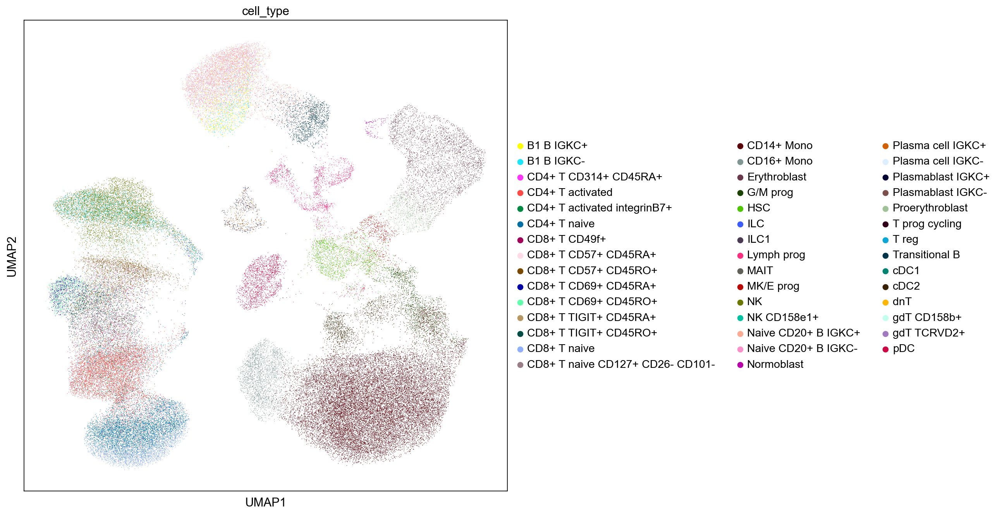

In [14]:
# Neurips dataset

sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(adata_neurips, color = ['cell_type'], color_map = 'viridis')

In [15]:
#Computing a neighborhood of observations using latent space

sc.pp.neighbors(neurips_subset, use_rep="X_totalVI")   

sc.tl.umap(neurips_subset)

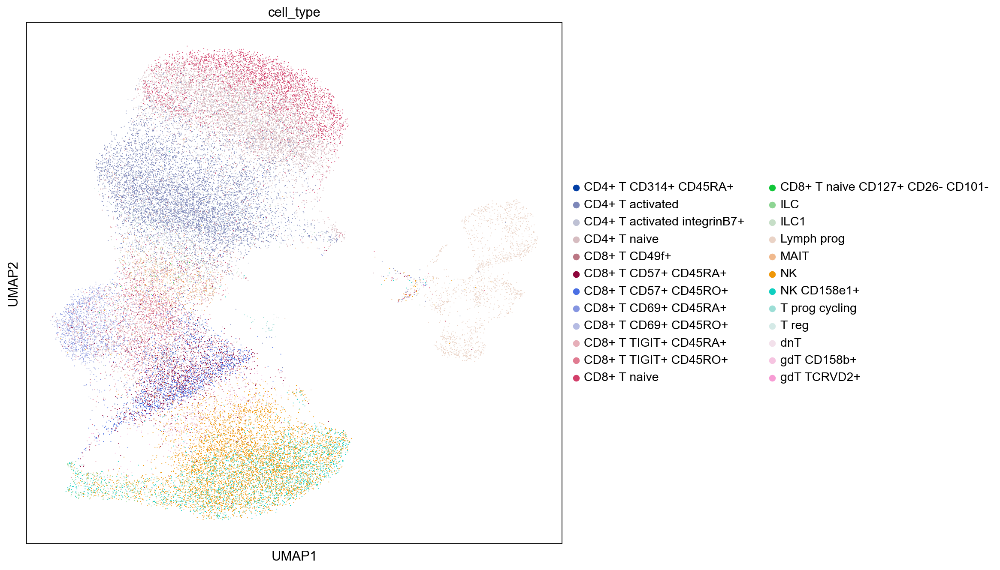

In [16]:
# Selected cells cells from Neurips dataset, coloured by samples

sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(neurips_subset, color = ['cell_type'], color_map = 'viridis')

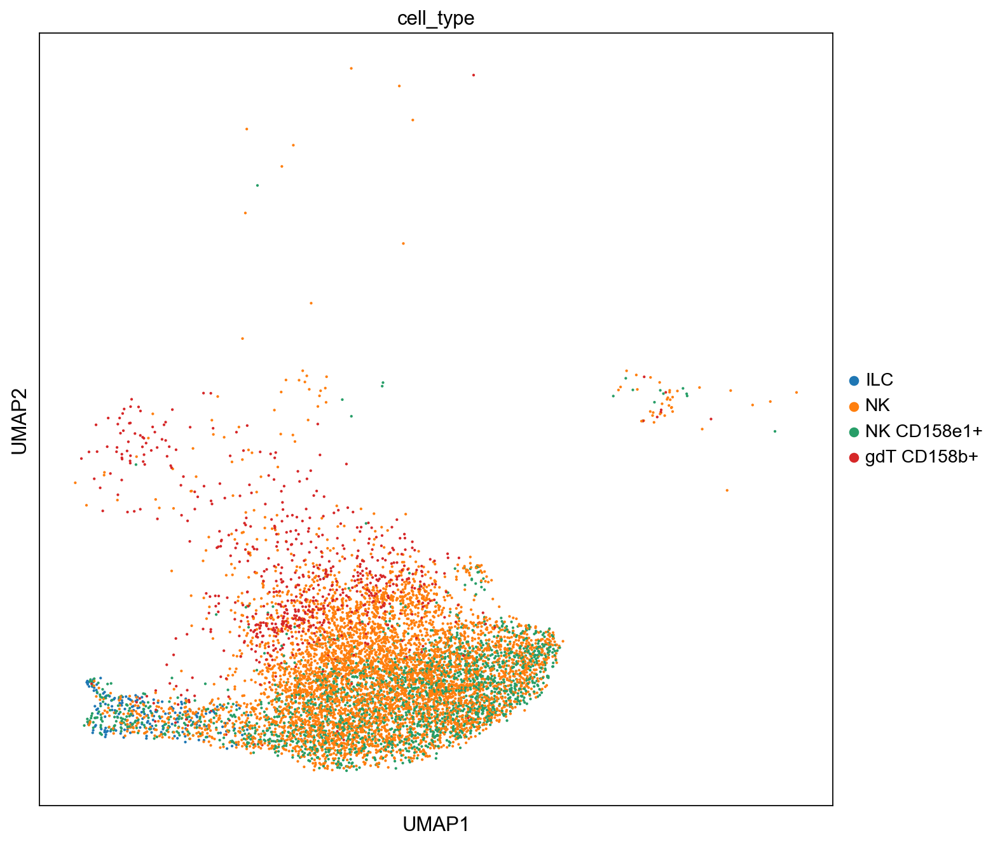

In [17]:
# Selected cells cells from Neurips dataset

sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(neurips_nk, color = ['cell_type'], color_map = 'viridis')

# 2.  Markers by Yang et al. 

- sscRNA-seq on BM (n=6) and PB (n=2). In total, 5567 and 3046 NK cells from the BM and blood were analyzed. 

- Recently, the definition of the NK cell-restricted progenitor population has been redefined as Lin− CD34+CD38+CD123−CD45RA+CD7+CD10+CD127− cells as a consistent fraction of putative NK precursors in secondary lymphoid organs turn out to be ILCs or ILC progenitors

- NK cell maturation occurs mostly in secondary lymphoidal organs. The analyses of NK cells from secondary lymphoidal organs will give insights into early NK developmental stages. In this study they were not able to detect earlier development states of NK cells. 

- Markers to define NK lineage: CD94 (KLRD1), NKp80 (KLRF1), NKG7 and GNLY. NCAM1 (CD56) as well, but was not well represented in this study.

- Markers used to catch NK cells (also progenitors/ILCs): Lin−, CD7+ (not all cells yet CD56+).

- Within this Lin−, CD7+ population 90% are CD56bright NK cells.

- Remaining CD56dim/- cells: over 50% express KLRC1 (NKp80) and CD16 => mature NK cells, rest (CD7+, CD56dim/−, CD16−, NKp80−) probably ILCs, NK progenitors, immature NK cells or immature cells with multiple lineages potential.  

- maturation of  CD56dimCXCR4+ NK cells = NKG2A, CD62L, CD57


### 7 clusters from BM NK cells: #

1. CD56bright NK

2. Transitional NK (intermediate expression of signature genes of either CD56bright or CD56dimCD57+ NK cells)

3. Adaptive NK: High KLRC2 expression, only detected from BM, mostly composed of cells of one donor. Also cells from few other samples detected, not high KLRC2, but instead high CD52 expression.

4. Mature NK:  High expression of molecules important for cytotoxic function. Enrichment of gene sets, including the apical junction, regulation of actin cytoskeleton, NK cell-mediated cytotoxicity, and structure constituent of the cytoskeleton in the “Mature NK” cluster com- pared to the rest of the cells

5. Terminal NK: Mature NK and terminal NK clusters together form the CD57+ cell population. Similar transcriptional and functional profile as mature NKs, but increased expression of ZEB2,  CX3CR1 and HAVCR2 (TIM-3). Dampened signaling and metabolic profiles => quiescent state? 

6. Active NK : same features as inflamed NK. Several genes that belong to the immediate early genes (IEGs). IEGs are induced rapidly in response to stimuli without nascent protein synthesis. Active transcription, activation of several signaling pathways (KRAS-MAPK, TRAF6-NF-kappa-B. Active NK cluster is potentially within the CD56dim NK population (mature NKs) with a decreased expression of the genes encoding cytolytic proteins compared to the mature NK cluster. Maybe not unique developmental stage. 

7. Inflamed NK (mostly composed of cells of one patient, who donored BM) 


### Markers: #

- Is NK: KLRD1 (CD94), KLRF1, NKG7, GNLY, NCAM1 (CD56), CD7

- CD56brigh: IL7RA (IL7R), SELL (CD62L), NKG2A (KLRC1), GZMK, CD44, XCL1, XCL2. Minimal expression of FCGR3A (CD16), B3GAT1 (CD57) and CD160. 

- Adaptive: KLRC2 (NKG2C), CD52, CD3E/D/G. Low expresison of FcεRγ (FCER1G), SYK (SYK), EAT-2 (SH2D1B), and PLZF (ZBTB16) compared to other clusters

- Mature NK: B3GAT1 (CD57), PRF1, GZMA, GZMB, GZMH, ACTB, ARPC2, CORO1A, CFL1, CST7, PFN1, ANXA1). 

- Terminal NK: 
 - bonemarrow: ZEB2, CX3CR1 and HAVCR2 (TIM-3), WDR74, SNORD3A, TMEM107, SNORD3D, RNU12, SNORD3B-2, SNORD3B-1, C12orf57, HIST1H1E, HIST1H1C, HIST1H1D, HIST2H2BE, RNU11, JUN, PTCH2, RP11-386I14.4,CD38. 
 - Peripheral blood: MYBL1, CX3CR1, RNU12, DDX17, HIST1H1C, TMEM107, SNORD3A, NKTR, WDR74, HIST2H2BE, HIST1H1E, HIST1H1D

- Active NK: NFKBIA, JUN, JUNB, ZFP36, DOS, FOSB, DUSP1, NR4A2, CXCR4

- Inflamed NK: IFIT3, IFIT2, TNF, CD69




## 2.1 NK lineage defining markers

In [18]:
eg = neurips_subset.copy()
sample_nk = neurips_nk.copy()

In [19]:
is_nk_yang = ['KLRD1', 'KLRF1', 'NKG7', 'GNLY', 'NCAM1'] #the most DE genes in NK cells

In [20]:
#calculating scores for gene set
sc.tl.score_genes(sample_nk, is_nk_yang, score_name = 'isnk_score')
sc.tl.score_genes(eg, is_nk_yang, score_name = 'isnk_score')

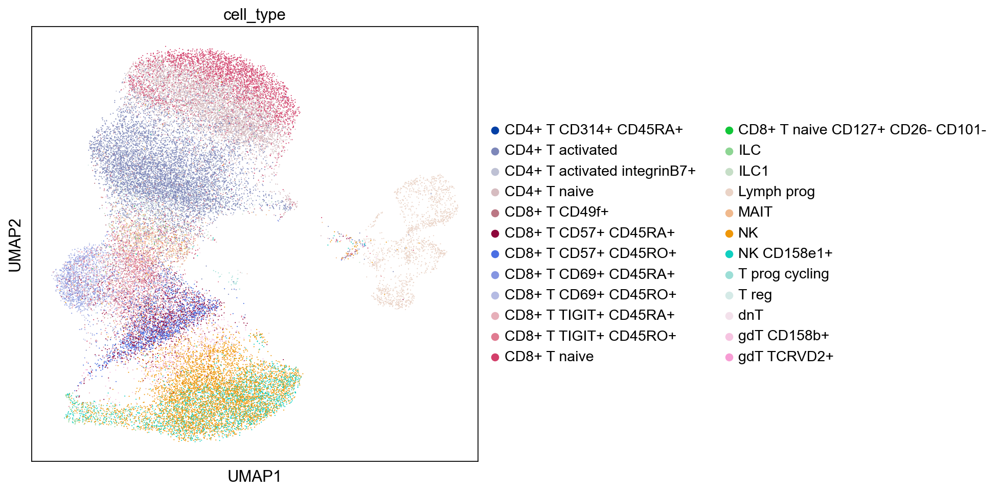

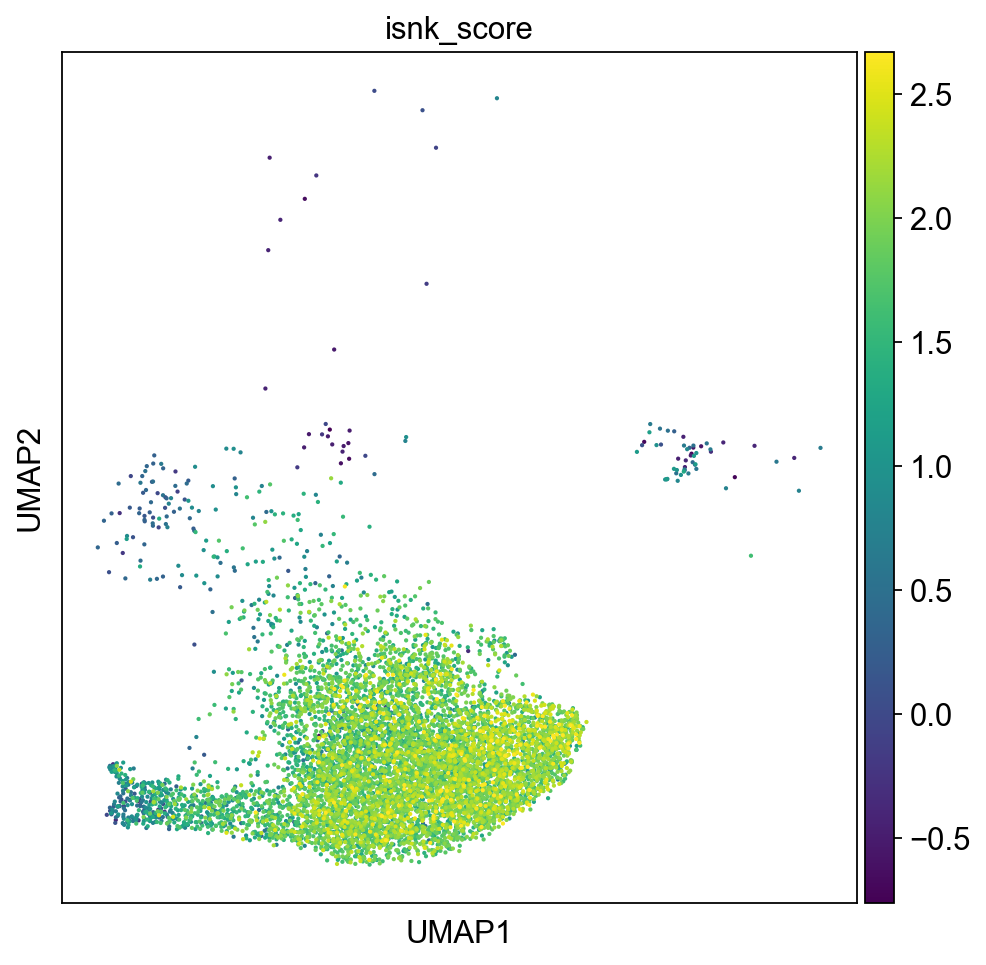

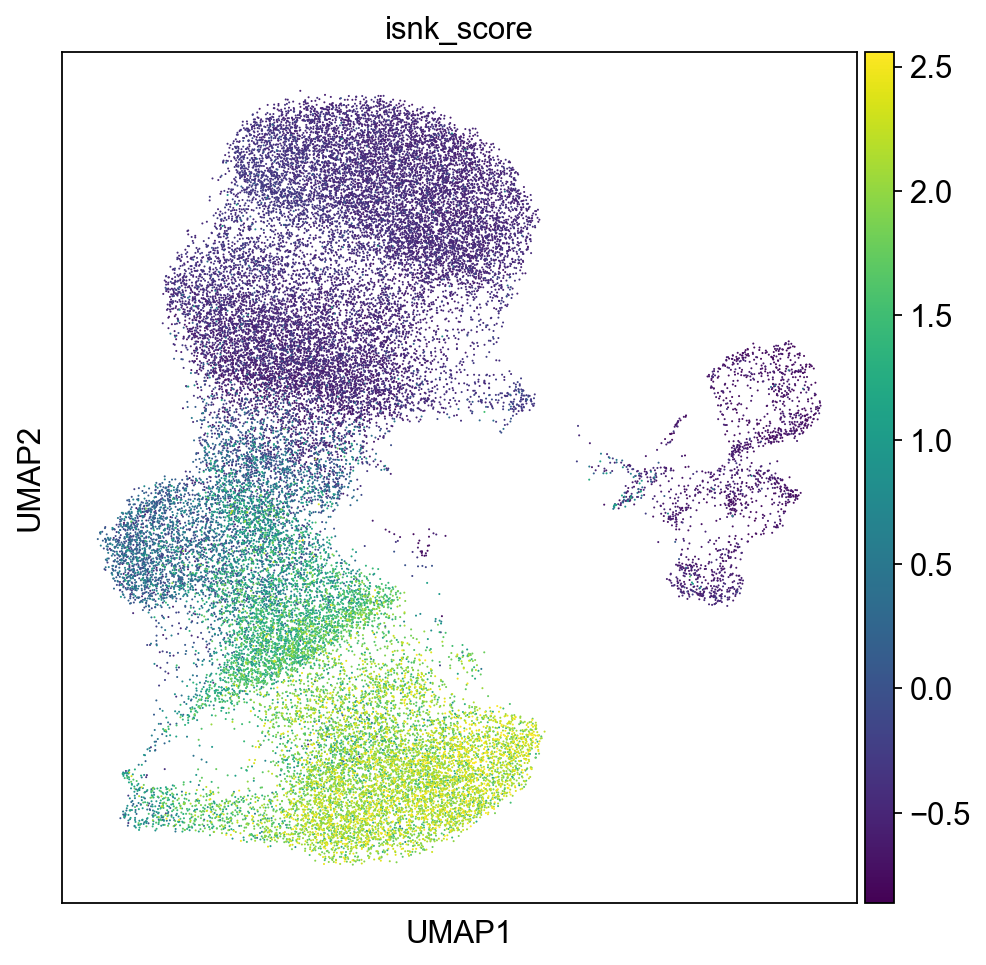

In [21]:
sc.set_figure_params(figsize=(7, 7))

sc.pl.umap(eg, color = ['cell_type'], vmax="p99", color_map = 'viridis', ncols=2)

sc.pl.umap(sample_nk, color = ['isnk_score'], vmax="p99", color_map = 'viridis', ncols=2)

sc.pl.umap(eg, color = ['isnk_score'], vmax="p99", color_map = 'viridis', ncols=2)



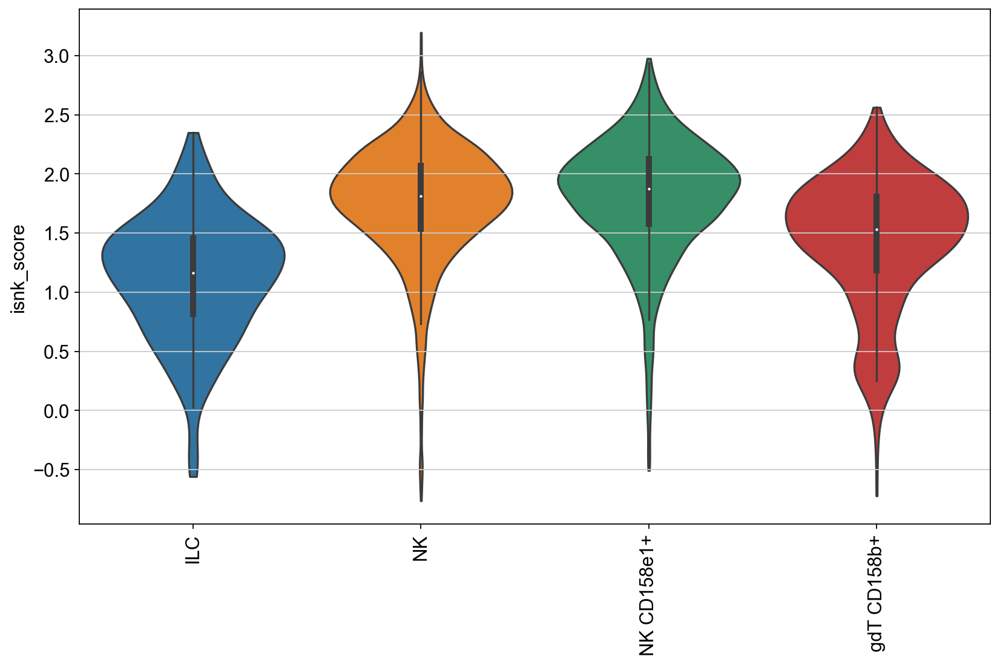

In [22]:
sc.set_figure_params(figsize=(10, 7))

sc.pl.violin(sample_nk, ['isnk_score'], groupby='cell_type', stripplot=False, inner='box', rotation=90)  



Scores for NK lineage defining markers are visualized above. Clearly lower expression of markers is seen in gd T cells. Similarly, also ILCs appear to have slightly lower scores compared to NK cells. 

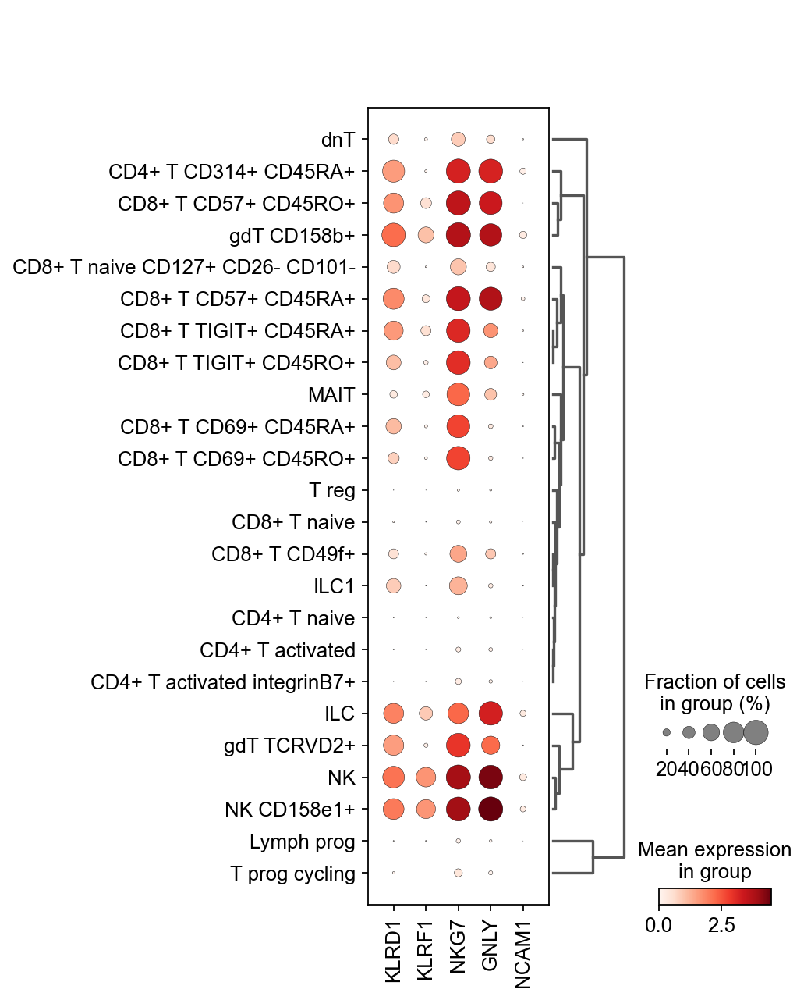

In [23]:
sc.pl.dotplot(eg, is_nk_yang, 'cell_type', dendrogram=True)

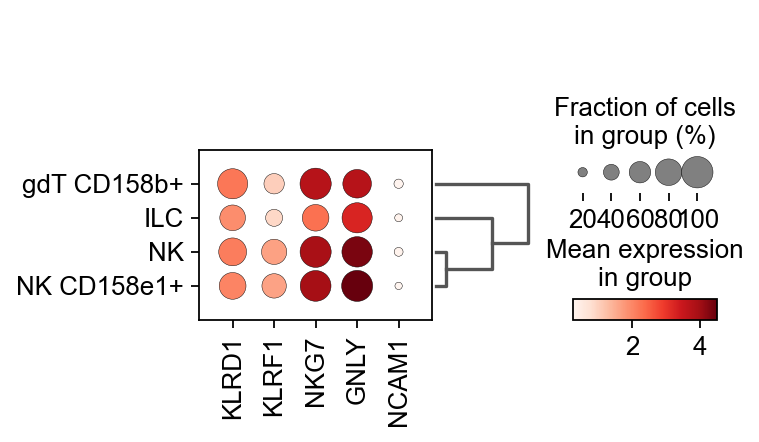

In [24]:
sc.pl.dotplot(sample_nk, is_nk_yang, 'cell_type', dendrogram=True)

These dotplots are generated from normalized RNA counts. All markers except NCAM1 are expressed at high/intermediate levels in NK cells. Despite low expression, NCAM1 appears to be very NK cell specific. NKG7 instead is expressed also in CD8+ T cells at high levels. 

## 2.1 Immature CD56bright NK cells

In [25]:
cd56bright_rna= ['IL7R', 'SELL', 'KLRC1', 'GZMK', 'CD44', 'XCL1', 'XCL2']
cd56bright_rna_low = ['FCGR3A', 'B3GAT1']

In [26]:
#calculating scores for gene set

sc.tl.score_genes(sample_nk, cd56bright_rna, score_name = 'CD56bright_score')
sc.tl.score_genes(sample_nk, cd56bright_rna_low, score_name = 'CD56bright_low_score')

sc.tl.score_genes(eg, cd56bright_rna, score_name = 'CD56bright_score')
sc.tl.score_genes(eg, cd56bright_rna_low, score_name = 'CD56bright_low_score')

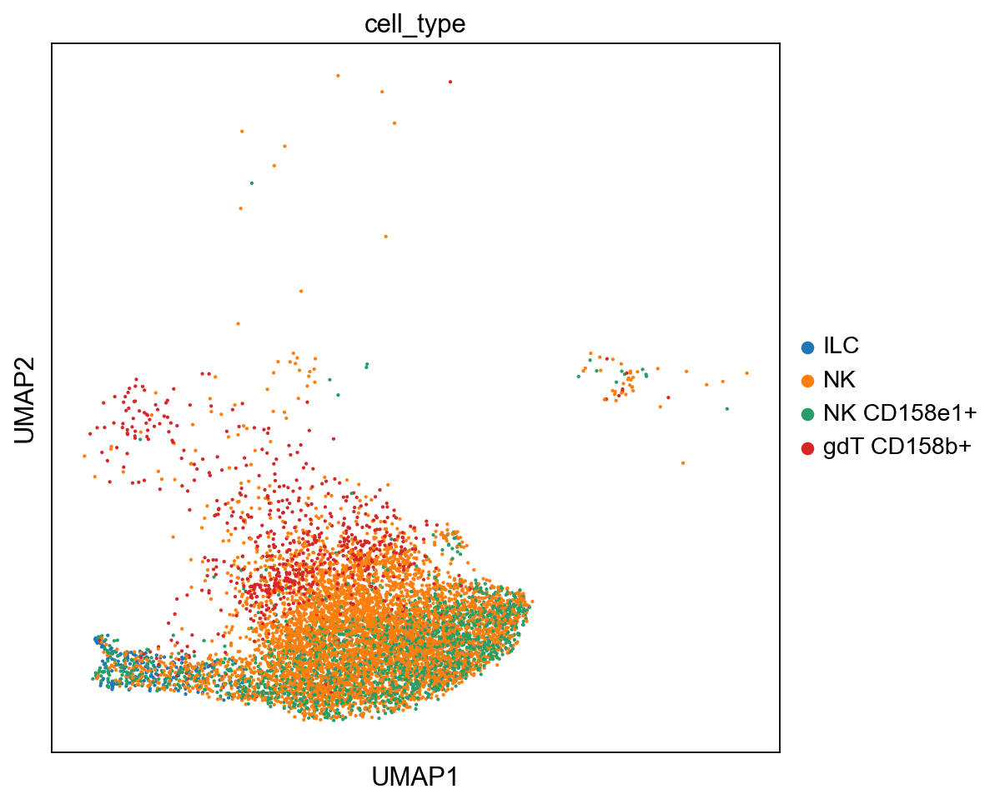

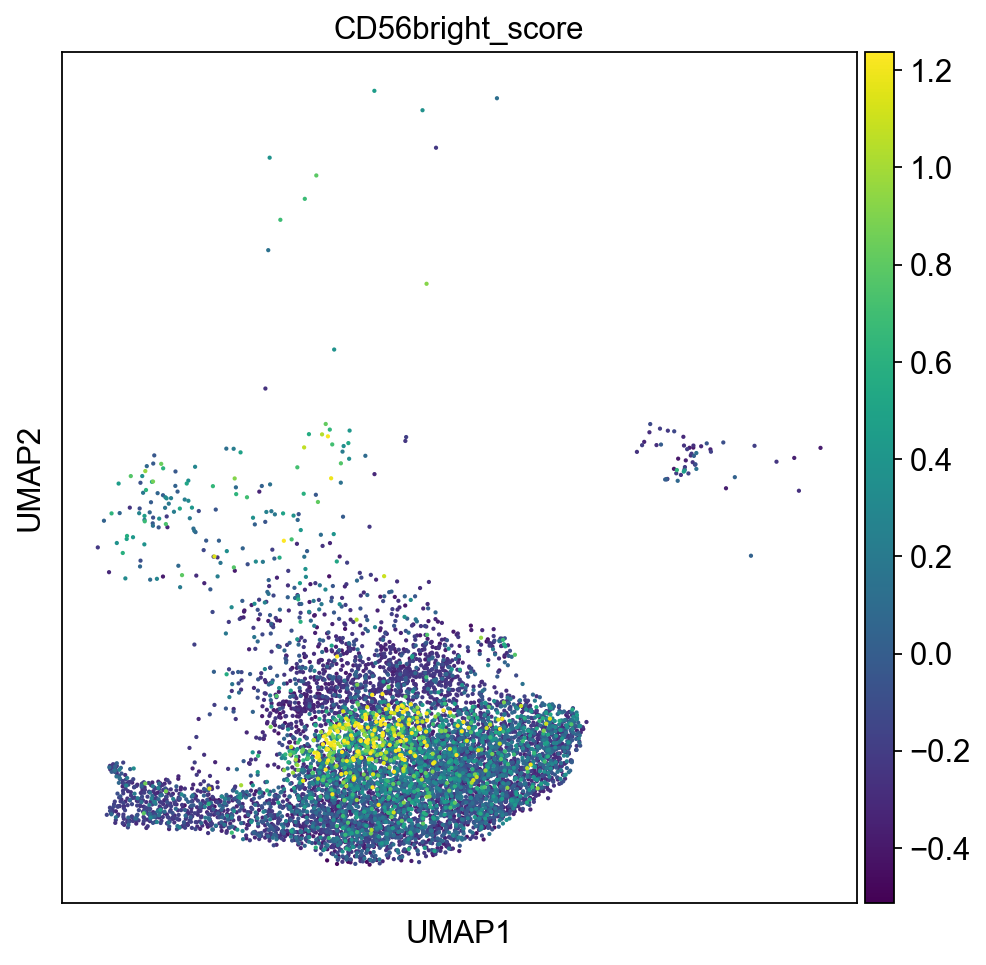

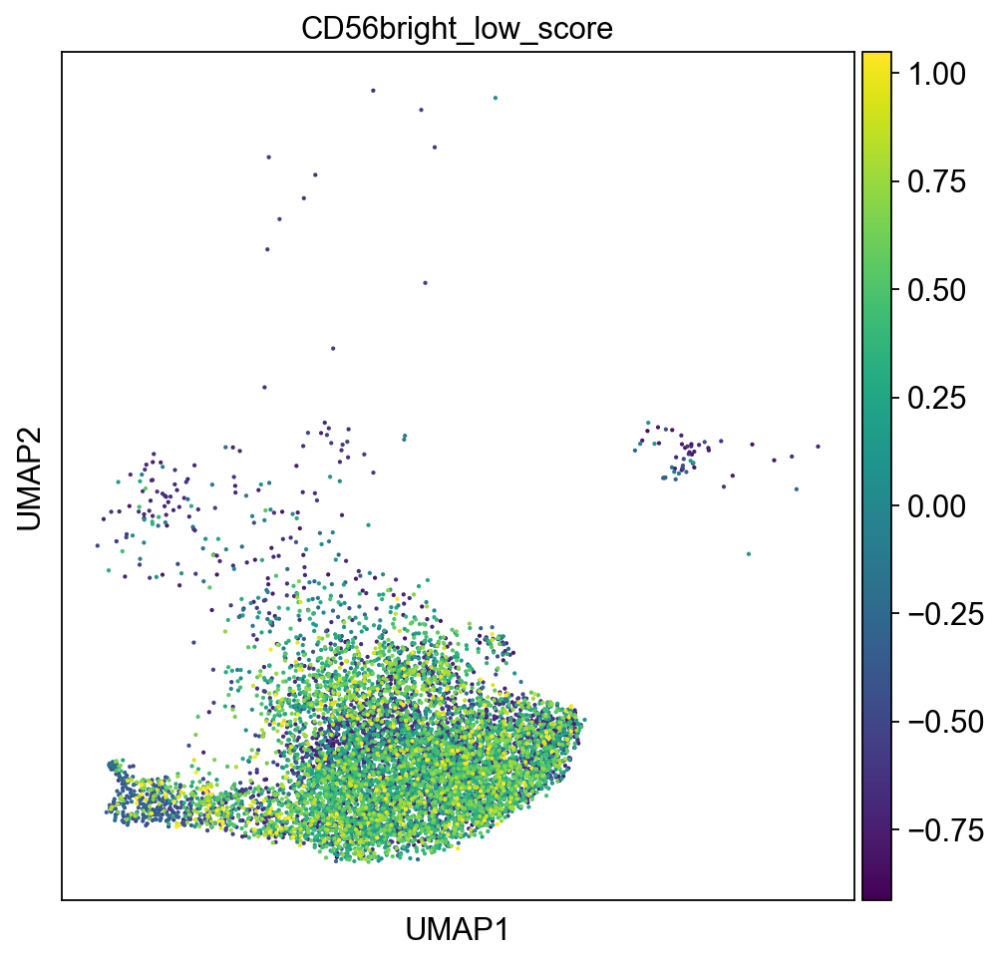

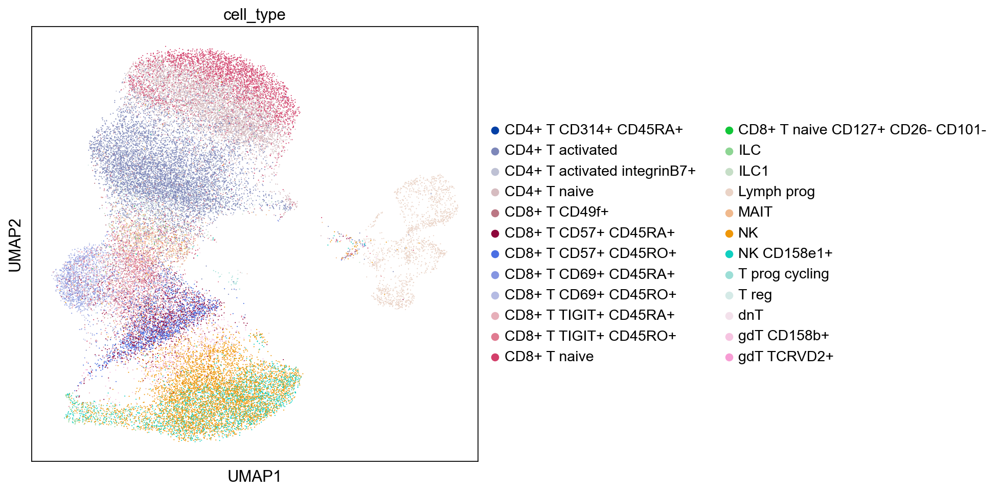

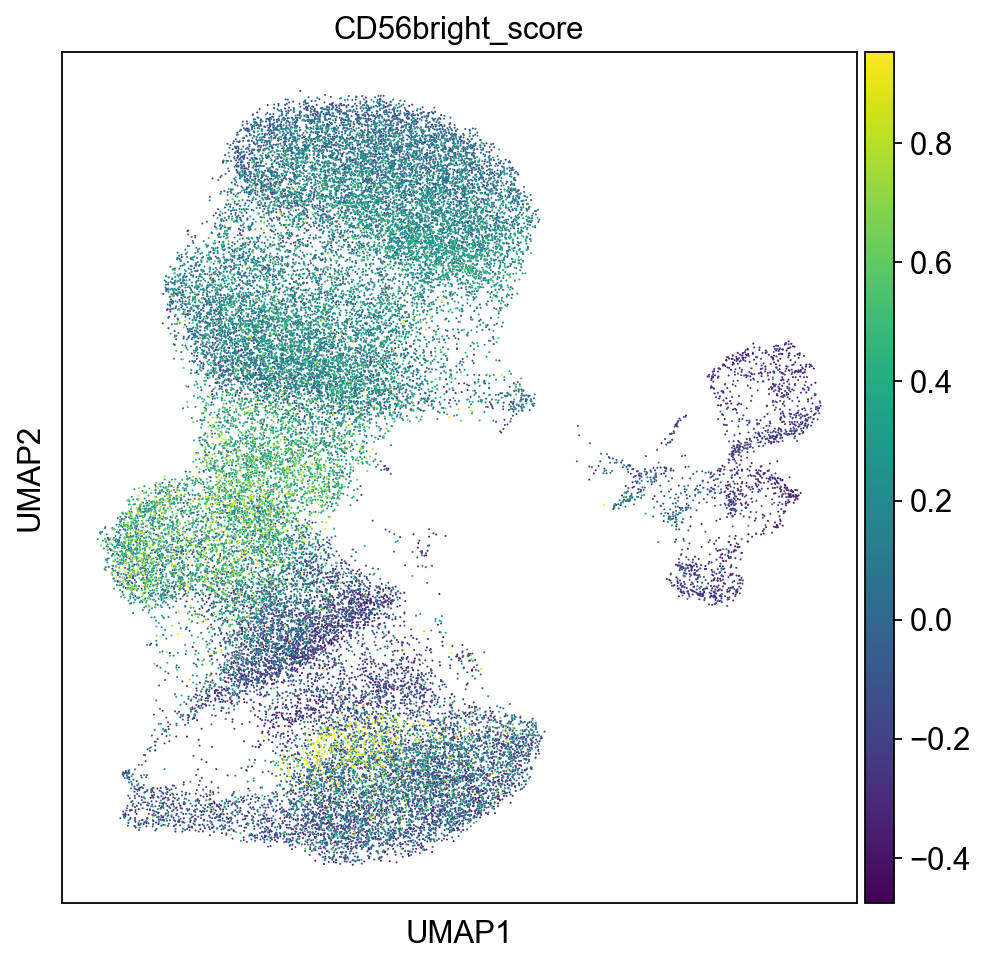

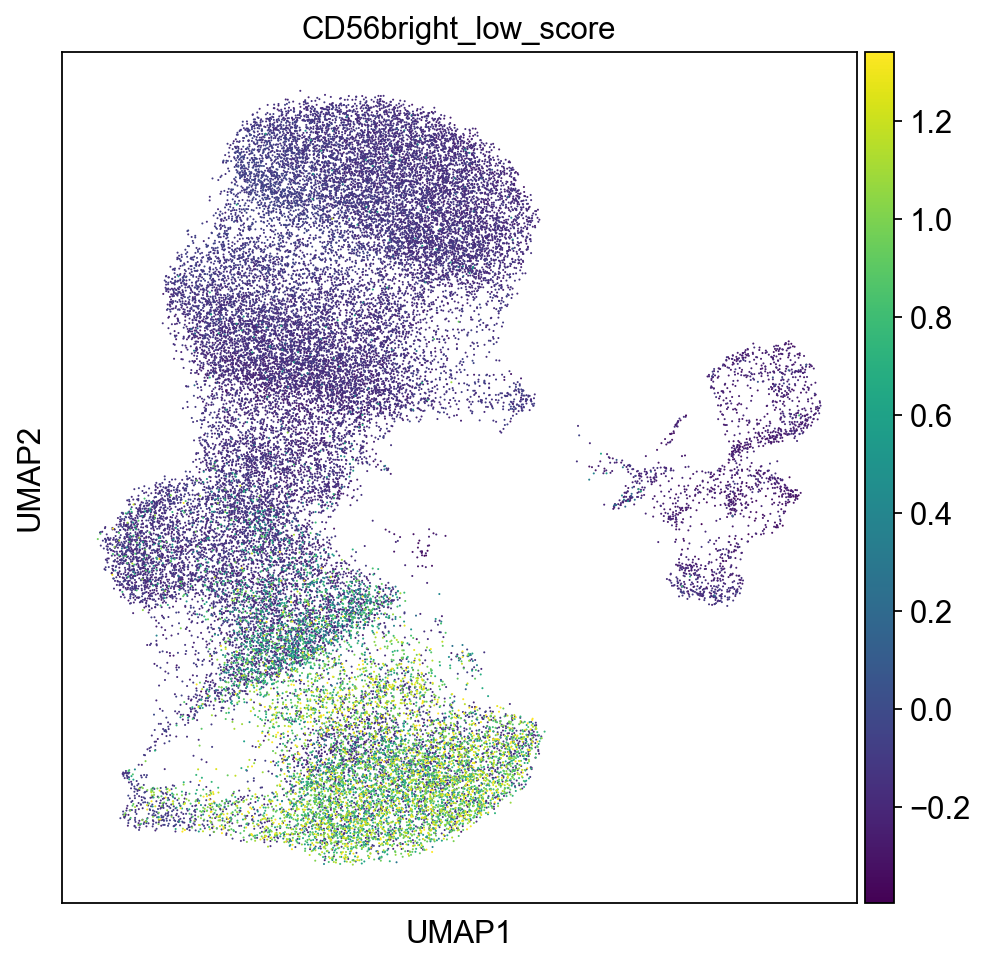

In [27]:
sc.set_figure_params(figsize=(7, 7))

sc.pl.umap(sample_nk, color = ['cell_type'], vmax="p99", color_map = 'viridis', ncols=2)

sc.pl.umap(sample_nk, color = ['CD56bright_score'], vmax="p99", color_map = 'viridis', ncols=2)

sc.pl.umap(sample_nk, color = ['CD56bright_low_score'], vmax="p99", color_map = 'viridis', ncols=2)

sc.pl.umap(eg, color = ['cell_type'], vmax="p99", color_map = 'viridis', ncols=2)

sc.pl.umap(eg, color = ['CD56bright_score'], vmax="p99", color_map = 'viridis', ncols=2)

sc.pl.umap(eg, color = ['CD56bright_low_score'], vmax="p99", color_map = 'viridis', ncols=2)



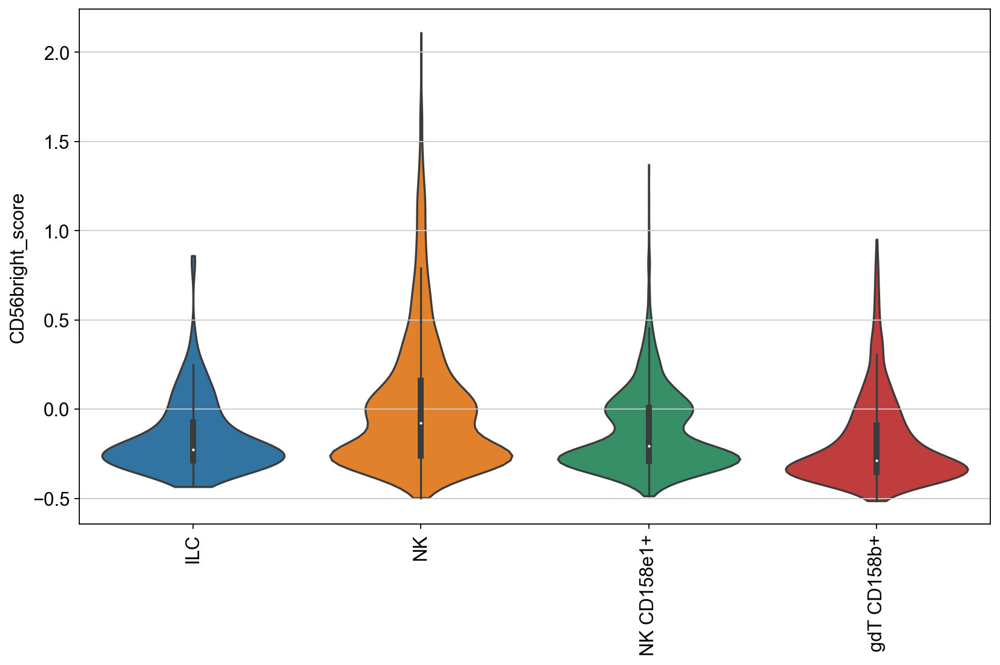

In [28]:
sc.set_figure_params(figsize=(10, 7))

sc.pl.violin(sample_nk, ['CD56bright_score'], groupby='cell_type', stripplot=False, inner='box', rotation=90)  


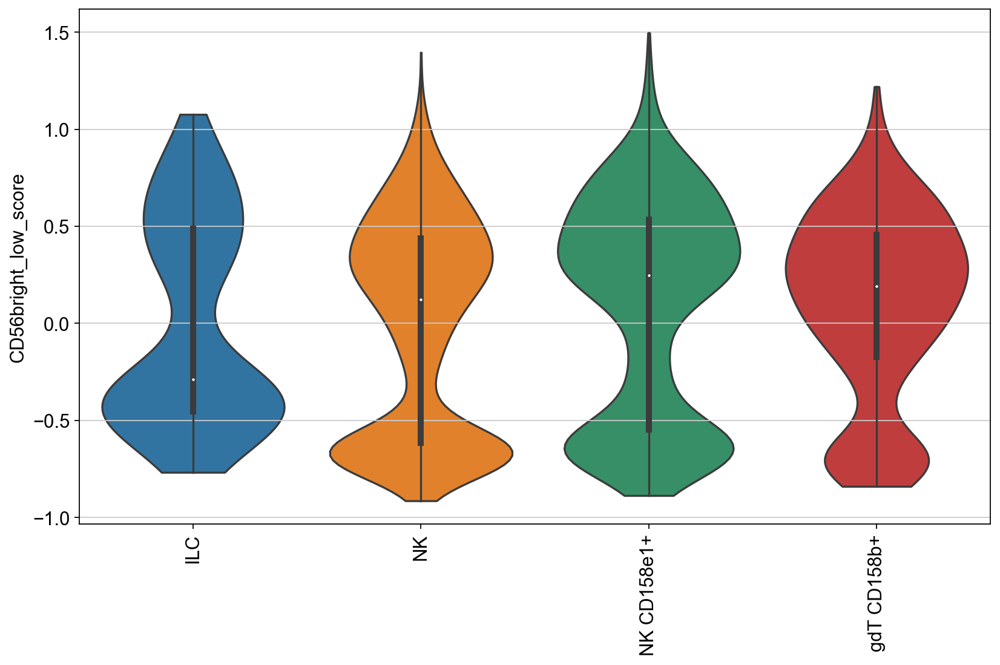

In [29]:
sc.set_figure_params(figsize=(10, 7))

sc.pl.violin(sample_nk, ['CD56bright_low_score'], groupby='cell_type', stripplot=False, inner='box', rotation=90)  



Scores for immature CD56bright NK cell markers are visualized above. NK CD158e1+ cells represent mature NK cells. From here we can see that these markers are expressed at higher level in immature NK cells when comparing to more mature NK cells. UMAPs showing the gene scores for low- and high-expression markers nicely divide NK cell island into immature and mature part. Generally, population of CD56bright NK cells is  low in the bone marrow, which could be seen from violinplots. Only small proportion of cells appear to have high scores for markers that are expected to show high expression in immature cells. And vice versa, relatively small population is showing low expression of markers that are expected to have low expression. 

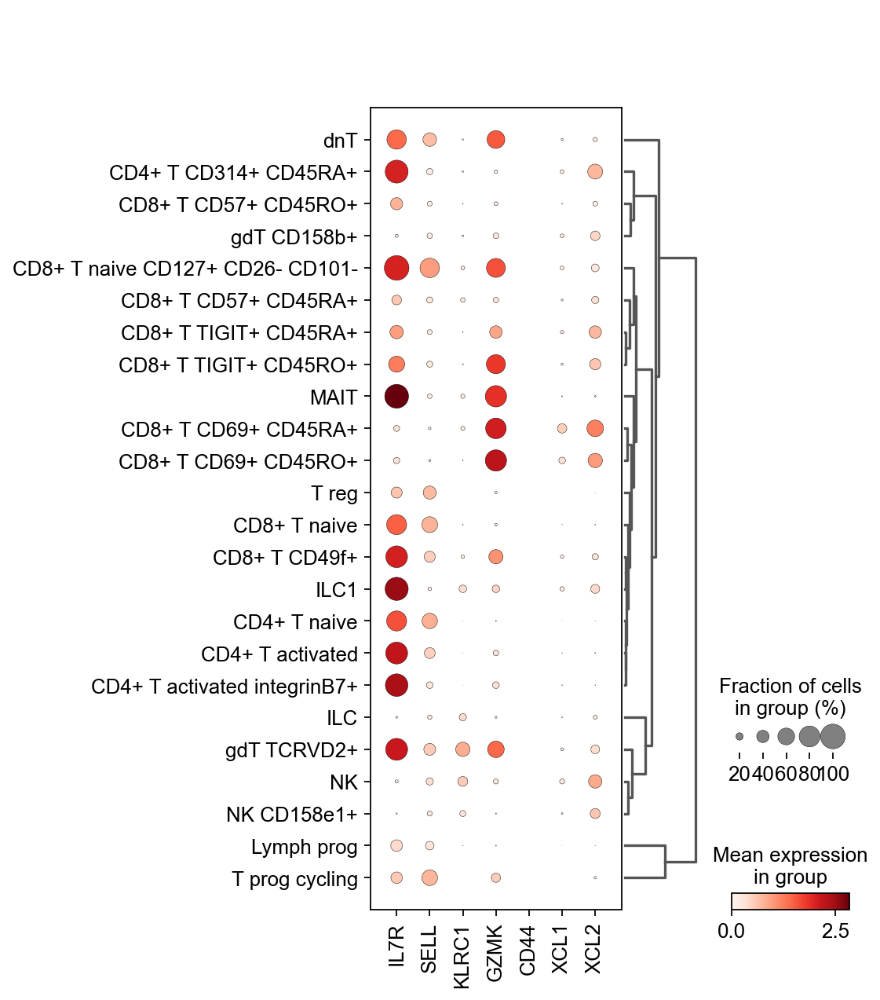

In [30]:
sc.pl.dotplot(eg, cd56bright_rna, 'cell_type', dendrogram=True)

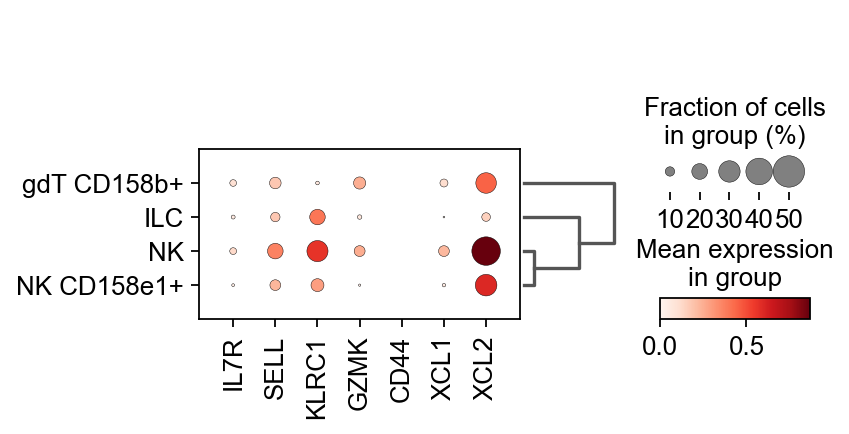

In [31]:
sc.pl.dotplot(sample_nk, cd56bright_rna, 'cell_type', dendrogram=True)

These dotplots abowe are generated from normalized RNA counts. These markers were highly expressed in immature CD56bright cluster in study conducted by Yang et al. Population of CD56bright NK cells is genrally low in bonemarrow, which might be seen from these figures. 

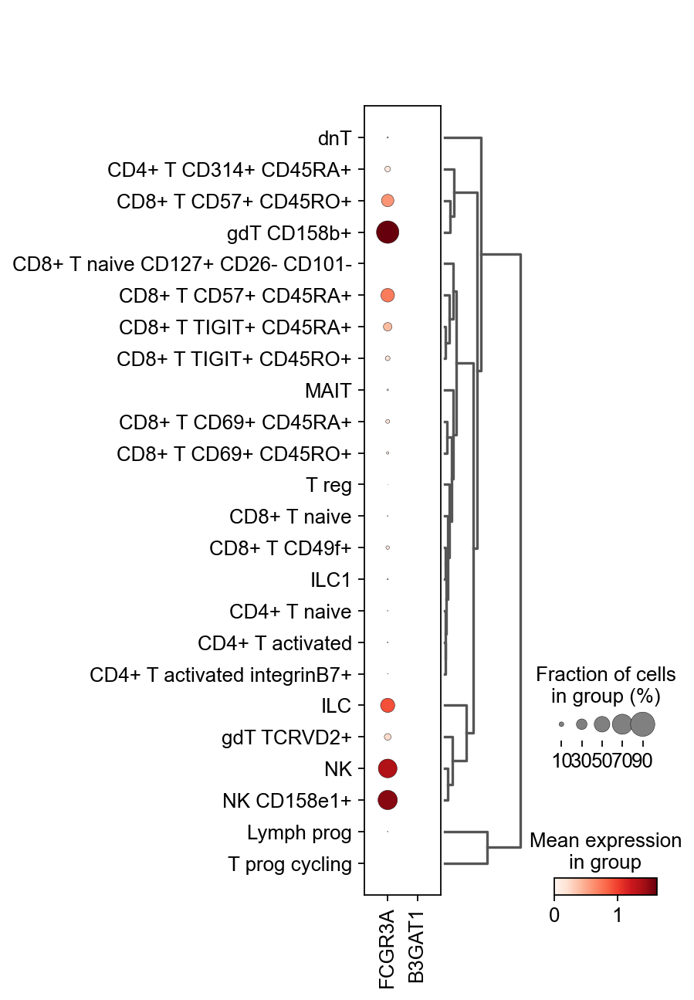

In [32]:
sc.pl.dotplot(eg, cd56bright_rna_low, 'cell_type', dendrogram=True)

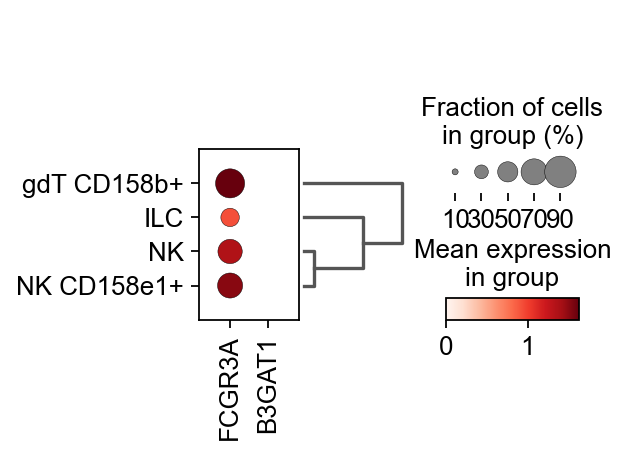

In [33]:
sc.pl.dotplot(sample_nk, cd56bright_rna_low, 'cell_type', dendrogram=True)

These dotplots are generated from normalized RNA counts and showing expression of markers that are expected to have low expression in immature NK cells. Unfortunately expression of B3GAT1 (CD57) was not succesfully measured in this dataset.  

## 2.2 Transitional NK

Defined by down-regulation of the genes of CD56bright cluster and uppregulation of the genes of CD56dim cluster. 


## 2.3 Adaptive NK

In [34]:
adaptive_high_rna = ['KLRC2', 'CD52', 'CD3E', 'CD3D', 'CD3G', 'IL32' ]
adaptive_low_rna = ['FCER1G', 'SYK', 'SH2D1B', 'ZBTB16']


In [35]:
#calculating scores for gene sets
sc.tl.score_genes(eg, adaptive_high_rna, score_name = 'adaptive_high_score')
sc.tl.score_genes(eg, adaptive_low_rna, score_name = 'adaptive_low_score')


In [36]:
#calculating scores for gene sets

sc.tl.score_genes(sample_nk, adaptive_high_rna, score_name = 'adaptive_high_score')
sc.tl.score_genes(sample_nk, adaptive_low_rna, score_name = 'adaptive_low_score')

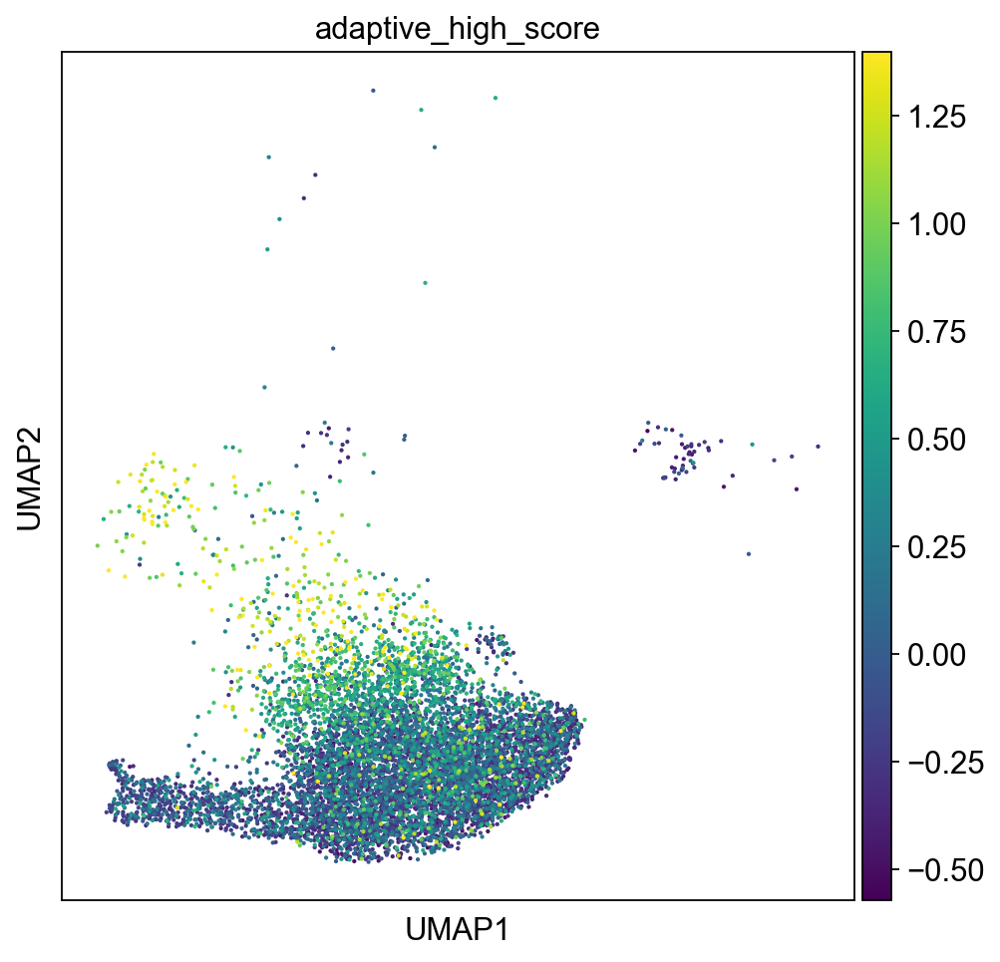

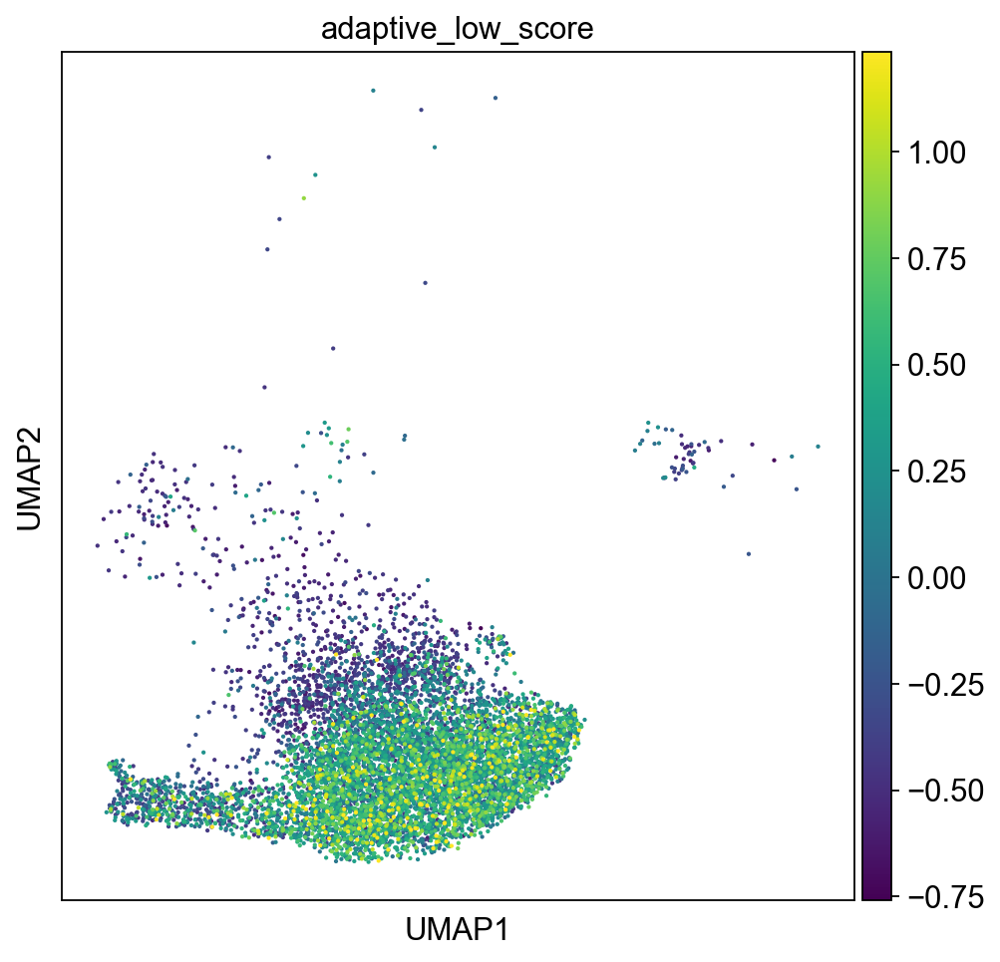

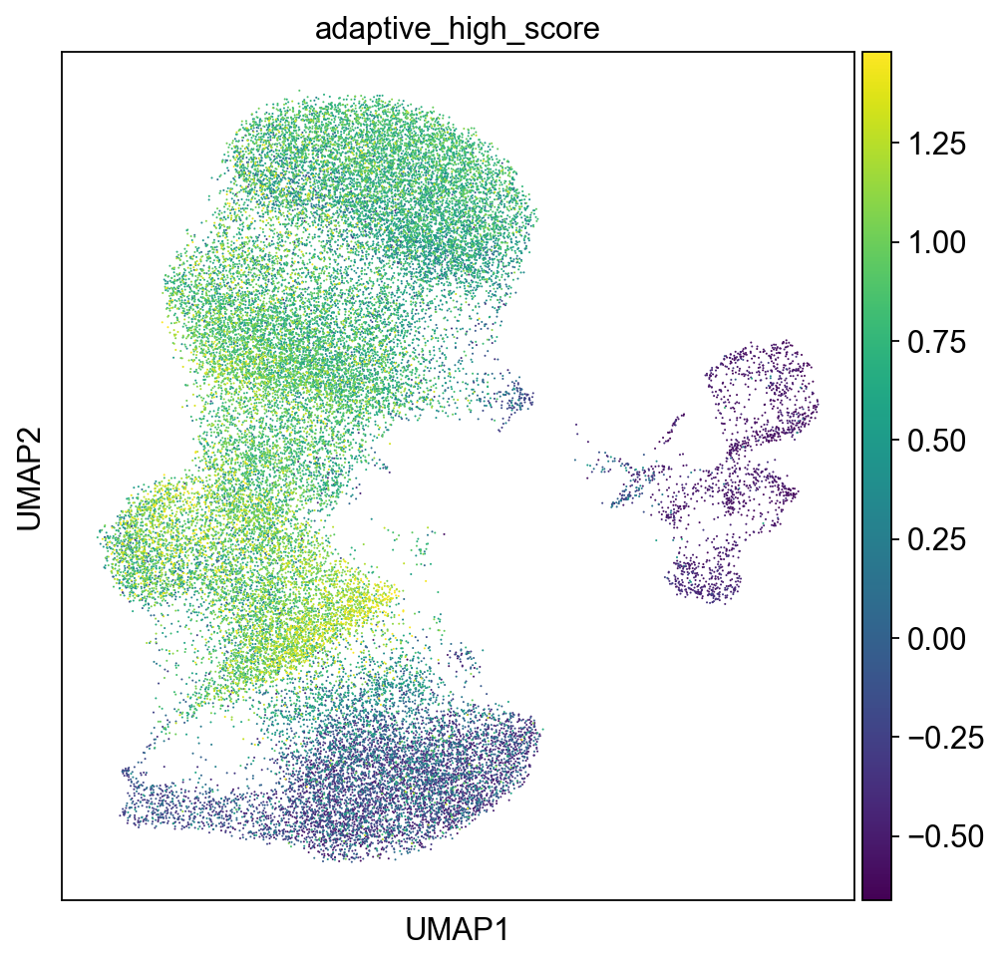

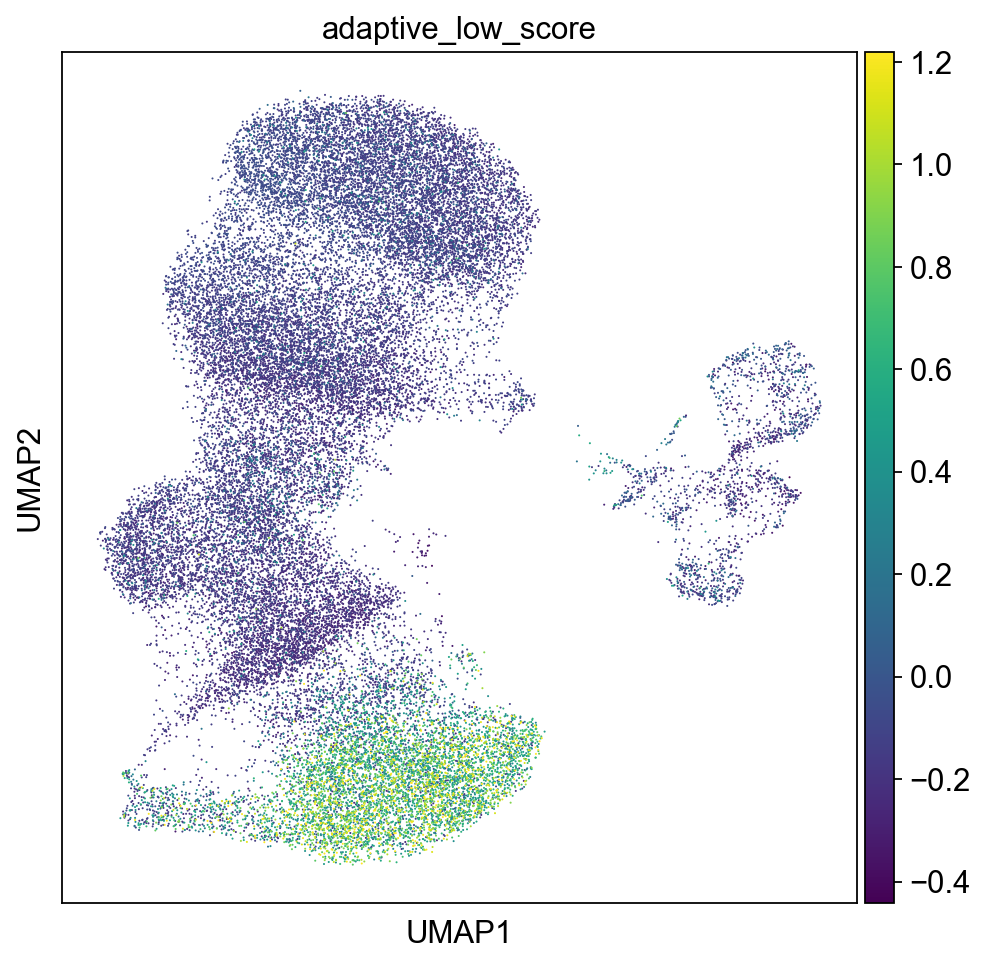

In [37]:
sc.set_figure_params(figsize=(7, 7))

sc.pl.umap(sample_nk, color = ['adaptive_high_score'], vmax="p99", color_map = 'viridis', ncols=2)

sc.pl.umap(sample_nk, color = ['adaptive_low_score'], vmax="p99", color_map = 'viridis', ncols=2)

sc.pl.umap(eg, color = ['adaptive_high_score'], vmax="p99", color_map = 'viridis', ncols=2)

sc.pl.umap(eg, color = ['adaptive_low_score'], vmax="p99", color_map = 'viridis', ncols=2)


Highly expressed in adaptive NK cells


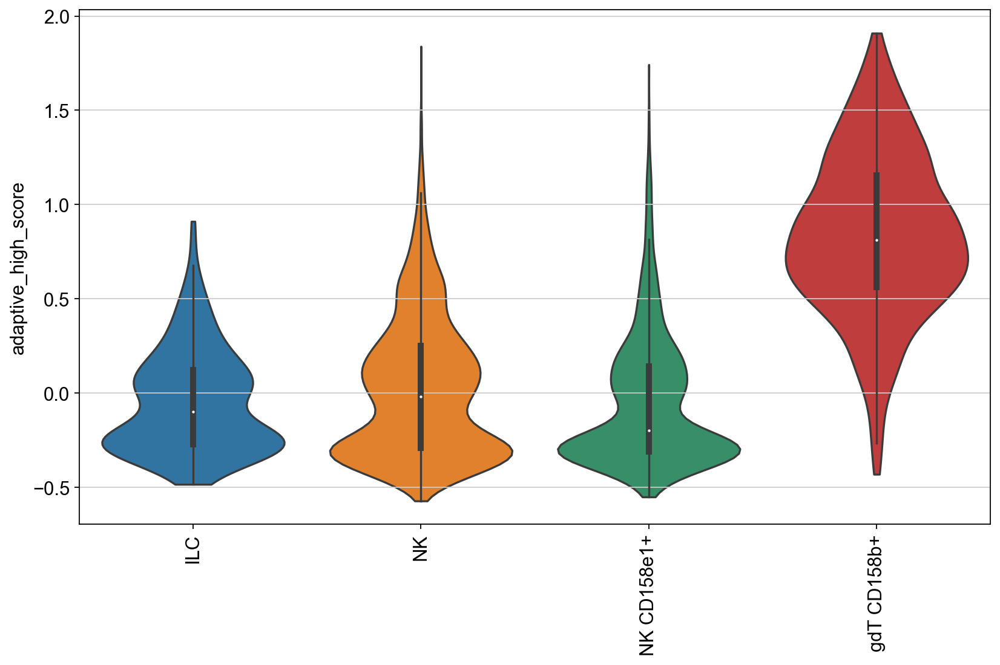

Lower expression in adaptive NK cells


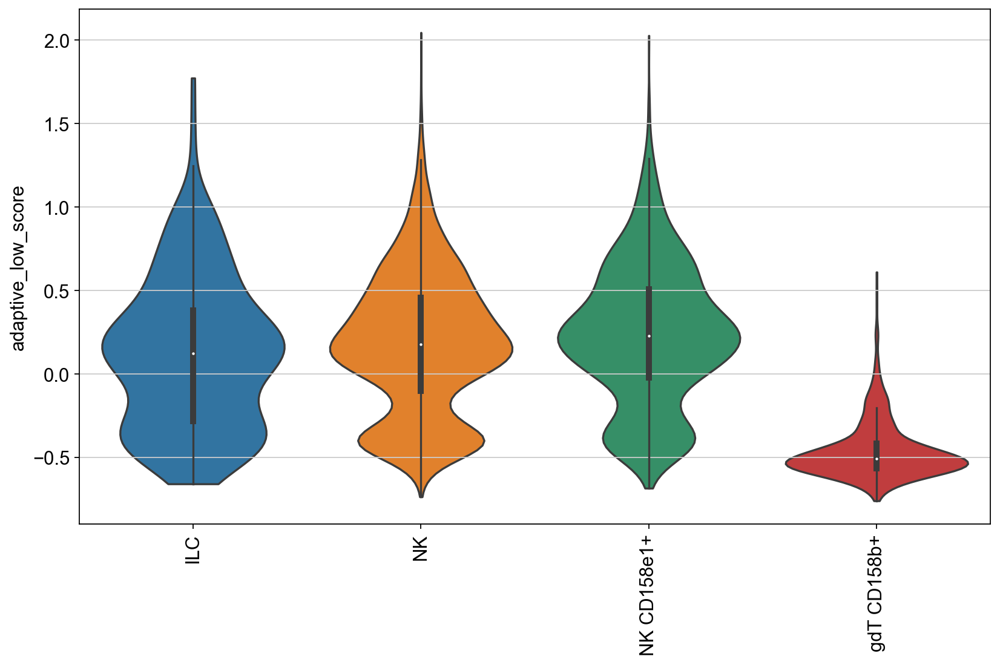

In [38]:
sc.set_figure_params(figsize=(10, 7))

print("Highly expressed in adaptive NK cells")
sc.pl.violin(sample_nk, ['adaptive_high_score'], groupby='cell_type', stripplot=False, inner='box', rotation=90)  

print("Lower expression in adaptive NK cells")
sc.pl.violin(sample_nk, ['adaptive_low_score'], groupby='cell_type', stripplot=False, inner='box', rotation=90)  



In [39]:
sc.pl.dotplot(eg, adaptive_high_rna, 'cell_type', dendrogram=True)

KeyError: "The key 'CD52' is found in both adata.obs and adata.var_names."

In [ ]:
sc.pl.dotplot(sample_nk, adaptive_high_rna, 'cell_type', dendrogram=True)

These dotplots are generated from normalized RNA counts and showing expression of markers that are expected to have high expression in adaptive NK cells.

In [ ]:
sc.pl.dotplot(eg, adaptive_low_rna, 'cell_type', dendrogram=True)

In [ ]:
sc.pl.dotplot(sample_nk, adaptive_low_rna, 'cell_type', dendrogram=True)

These dotplots are generated from normalized RNA counts and showing expression of markers that are expected to have lower expression in adaptive NK cells.

## 2.4 Mature NK

In [ ]:
mature_rna= ['B3GAT1', 'PRF1', 'GZMA', 'GZMB', 'GZMH', 'ACTB', 'ARPC2', 'CORO1A', 'CFL1', 'CST7', 'PFN1', 'ANXA1']


In [ ]:
#calculating scores for gene sets
sc.tl.score_genes(eg, mature_rna, score_name = 'mature_score')
sc.tl.score_genes(sample_nk, mature_rna, score_name = 'mature_score')

In [ ]:
sc.set_figure_params(figsize=(7, 7))

sc.pl.umap(sample_nk, color = ['mature_score'], vmax="p99", color_map = 'viridis', ncols=2)
sc.pl.umap(eg, color = ['mature_score'], vmax="p99", color_map = 'viridis', ncols=2)



In [ ]:
sc.set_figure_params(figsize=(10, 7))

sc.pl.violin(sample_nk, ['mature_score'], groupby='cell_type', stripplot=False, inner='box', rotation=90)  

In [ ]:
sc.pl.dotplot(eg, mature_rna, 'cell_type', dendrogram=True)

In [ ]:
sc.pl.dotplot(sample_nk, mature_rna, 'cell_type', dendrogram=True)

These dotplots are generated from normalized RNA counts and showing expression of markers that are expected to have high expression in mature NK cells. Many of the markers are not NK cells specific but are expressed in various cell types, probably house keeping genes, such as ACTB? UMAPs showing the scores for this gene set shows that mature NK cells localize in the upper left part of the island. Granzymes are quite NK cell specific. 

## 2.5 Terminal NK cells 

In [ ]:
terminal_rna_bm = ['ZEB2',  'CX3CR1','HAVCR2','WDR74', 'SNORD3A', 'TMEM107', 'SNORD3D', 'RNU12', 'SNORD3B-2', 'SNORD3B-1', 'C12orf57', 'HIST1H1E', 'HIST1H1C', 'HIST1H1D', 'HIST2H2BE', 'RNU11', 'JUN', 'PTCH2', 'RP11-386I14.4','CD38']

In [ ]:
#calculating scores for gene sets

sc.tl.score_genes(eg, terminal_rna_bm, score_name = 'terminal_score')
sc.tl.score_genes(sample_nk, terminal_rna_bm, score_name = 'terminal_score')


In [ ]:
sc.pl.umap(sample_nk, color = ['terminal_score'], vmax="p99", color_map = 'viridis', ncols=2)

sc.pl.umap(eg, color = ['terminal_score'], vmax="p99", color_map = 'viridis', ncols=2)


In [ ]:
sc.set_figure_params(figsize=(10, 7))

sc.pl.violin(sample_nk, ['terminal_score'], groupby='cell_type', stripplot=False, inner='box', rotation=90)  


In [ ]:
sc.pl.dotplot(eg, terminal_rna_bm , 'cell_type', dendrogram=True)

In [ ]:
sc.pl.dotplot(sample_nk, terminal_rna_bm , 'cell_type', dendrogram=True)

These dotplots are generated from normalized RNA counts and showing expression of markers that are expected to have lower expression in terminally maturated NK cells. Some of the genes were not succesfully measured in this dataset. 

## 2.6 Inflamed NK cells

According to the paper, this  cluster was mostly composed of cells of one patient, who donored BM. 

In [ ]:
inflamed_nk = ['IFIT3', 'IFIT2', 'TNF', 'CD69']


In [ ]:
#calculating scores for gene sets

sc.tl.score_genes(eg, inflamed_nk, score_name = 'inflamed_score')
sc.tl.score_genes(sample_nk, inflamed_nk, score_name = 'inflamed_score')


In [ ]:
sc.pl.umap(sample_nk, color = ['inflamed_score'], vmax="p99", color_map = 'viridis', ncols=2)

sc.pl.umap(eg, color = ['inflamed_score'], vmax="p99", color_map = 'viridis', ncols=2)



In [ ]:
sc.set_figure_params(figsize=(10, 7))

sc.pl.violin(sample_nk, ['inflamed_score'], groupby='cell_type', stripplot=False, inner='box', rotation=90)  



In [ ]:
sc.pl.dotplot(eg, inflamed_nk , 'cell_type', dendrogram=True)

In [ ]:
sc.pl.dotplot(sample_nk, inflamed_nk , 'cell_type', dendrogram=True)

These dotplots are generated from normalized RNA counts and showing expression of markers that are expected to have lower expression in inflamed NK cells. This NK cell population was found only from one patient in the study conducted by Yang et al. 

## 2.7. Active NK cells

In [ ]:

active_nk= ['NFKBIA', 'JUN', 'JUNB', 'ZFP36', 'FOS', 'FOSB', 'DUSP1', 'NR4A2', 'CD69','CXCR4']


In [ ]:
#calculating scores for gene sets
sc.tl.score_genes(eg, active_nk, score_name = 'active_score')
sc.tl.score_genes(sample_nk, active_nk, score_name = 'active_score')

In [ ]:
sc.pl.umap(sample_nk, color = ['active_score'], vmax="p99", color_map = 'viridis', ncols=2)

sc.pl.umap(eg, color = ['active_score'], vmax="p99", color_map = 'viridis', ncols=2)


In [ ]:
sc.set_figure_params(figsize=(10, 7))

sc.pl.violin(sample_nk, ['active_score'], groupby='cell_type', stripplot=False, inner='box', rotation=90)  



In [ ]:
sc.pl.dotplot(eg, active_nk , 'cell_type', dendrogram=True)

In [ ]:
sc.pl.dotplot(sample_nk, active_nk , 'cell_type', dendrogram=True)

These dotplots are generated from normalized RNA counts and showing expression of markers that are expected to have lower expression in active NK cells. 

# 3.  Ranking top 20 expressed genes in NK cells, ILCs and gd T cells

Currently, also ribosomal and mitochondrial genes are included, these will be removed.


In [ ]:
sc.tl.rank_genes_groups(sample_nk, 'cell_type')

In [ ]:
sc.pl.rank_genes_groups(sample_nk, n_genes = 20, sharey = False, ncols = 2)

NK vs. rest

- FCER1G is highly expressed in NK cells. FCER1G was used when exploring adaptive NK cell markers, there it was expected to have lower expression in adaptive NK cells than in other NK cell clusters. It was also seen that it is not highly expressed in ILCs. 
- NKG7 was used as a maturation marker
- KLRB1 (CD161) and HOPX were not explored.

NK CD158e1 vs rest

- FGFBP2 was not explored. 

In [ ]:
nk_high = ['HOPX', 'FCER1G', 'KLRB1', 'NKG7']
nk_cd158e1 = ['B2M', 'NKG7', 'GNLY', 'GZMB', 'MYOM2']
ilc_high = ['MALAT1', 'SYNE1', 'SYNE2', 'AHNAK']
gdT_high = ['CD3D', 'IL32', 'TRAC', 'CCL5']

In [ ]:
sc.pl.umap(sample_nk, color = ['cell_type'], vmax="p99", color_map = 'viridis', ncols=2)

sc.pl.umap(eg, color = ['cell_type'], vmax="p99", color_map = 'viridis', ncols=2)


In [ ]:
print("Highly expressed in NK cells")

sc.pl.umap(sample_nk, color = nk_high, vmax="p99", color_map = 'viridis', ncols=2)

sc.pl.umap(eg, color = nk_high, vmax="p99", color_map = 'viridis', ncols=2)



In [ ]:
print("Highly expressed in cd158e1+ NK cells")

sc.pl.umap(sample_nk, color = nk_cd158e1, vmax="p99", color_map = 'viridis', ncols=2)

sc.pl.umap(eg, color = nk_cd158e1, vmax="p99", color_map = 'viridis', ncols=2)




In [ ]:
print("Highly expressed in ILCs")

sc.pl.umap(sample_nk, color = ilc_high, vmax="p99", color_map = 'viridis', ncols=2)

sc.pl.umap(eg, color = ilc_high, vmax="p99", color_map = 'viridis', ncols=2)



In [ ]:
print("Highly expressed in gd T  cells")

sc.pl.umap(sample_nk, color = gdT_high, vmax="p99", color_map = 'viridis', ncols=2)

sc.pl.umap(eg, color = gdT_high, vmax="p99", color_map = 'viridis', ncols=2)

